In [ ]:
!pip install datasets evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 15.2 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [ ]:
from datasets import load_dataset
import json
from PIL import Image
import matplotlib.pyplot as plt
from transformers import AutoImageProcessor, ViTForImageClassification
from torchvision import transforms
import torch

# load 50k data from the train split
ds = load_dataset("mikehemberger/plantnet300K", split="train[:100000]")

ds

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/30.3k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/51 [00:00<?, ?it/s]

(…)-00000-of-00051-3f3a65374b495167.parquet:   0%|          | 0.00/513M [00:00<?, ?B/s]

(…)-00001-of-00051-a45fb5f5fc382b81.parquet:   0%|          | 0.00/583M [00:00<?, ?B/s]

(…)-00002-of-00051-42bf3a2d20f7aca1.parquet:   0%|          | 0.00/503M [00:00<?, ?B/s]

(…)-00003-of-00051-fb1369ff3958ce37.parquet:   0%|          | 0.00/516M [00:00<?, ?B/s]

(…)-00004-of-00051-02a003835697f660.parquet:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)-00005-of-00051-ce31e0c9591979b2.parquet:   0%|          | 0.00/517M [00:00<?, ?B/s]

(…)-00006-of-00051-84767c98bb2ddc46.parquet:   0%|          | 0.00/425M [00:00<?, ?B/s]

(…)-00007-of-00051-f12bb710db2f3c41.parquet:   0%|          | 0.00/556M [00:00<?, ?B/s]

(…)-00008-of-00051-1ea48daa7086eef4.parquet:   0%|          | 0.00/525M [00:00<?, ?B/s]

(…)-00009-of-00051-028c0512a07de83d.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

(…)-00010-of-00051-739402bb867e9547.parquet:   0%|          | 0.00/494M [00:00<?, ?B/s]

(…)-00011-of-00051-5d453256ae8b19ec.parquet:   0%|          | 0.00/515M [00:00<?, ?B/s]

(…)-00012-of-00051-70a393c24bedc468.parquet:   0%|          | 0.00/466M [00:00<?, ?B/s]

(…)-00013-of-00051-1724f8bb50650258.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

(…)-00014-of-00051-2ffc47c87784571b.parquet:   0%|          | 0.00/481M [00:00<?, ?B/s]

(…)-00015-of-00051-bdbf0b62568eb9e1.parquet:   0%|          | 0.00/497M [00:00<?, ?B/s]

(…)-00016-of-00051-4bd60334a26a9390.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

(…)-00017-of-00051-b95148c554896e1e.parquet:   0%|          | 0.00/505M [00:00<?, ?B/s]

(…)-00018-of-00051-a9b1c46f0b0e3a46.parquet:   0%|          | 0.00/571M [00:00<?, ?B/s]

(…)-00019-of-00051-4fa9faa0dd5c794c.parquet:   0%|          | 0.00/502M [00:00<?, ?B/s]

(…)-00020-of-00051-f769e4eb080f7013.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

(…)-00021-of-00051-db7b3342824db711.parquet:   0%|          | 0.00/528M [00:00<?, ?B/s]

(…)-00022-of-00051-b4eb64df280692f4.parquet:   0%|          | 0.00/538M [00:00<?, ?B/s]

(…)-00023-of-00051-c0b9d91fdf2b76d2.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

(…)-00024-of-00051-e6294bbc3b8ad4fd.parquet:   0%|          | 0.00/525M [00:00<?, ?B/s]

(…)-00025-of-00051-352d32db64af31fd.parquet:   0%|          | 0.00/513M [00:00<?, ?B/s]

(…)-00026-of-00051-556554be55ee56b7.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

(…)-00027-of-00051-2f77f9835e9ede9f.parquet:   0%|          | 0.00/522M [00:00<?, ?B/s]

(…)-00028-of-00051-e11367e5e68e3f5e.parquet:   0%|          | 0.00/523M [00:00<?, ?B/s]

(…)-00029-of-00051-033014a87563b3c9.parquet:   0%|          | 0.00/473M [00:00<?, ?B/s]

(…)-00030-of-00051-fd403cf85295d6d1.parquet:   0%|          | 0.00/456M [00:00<?, ?B/s]

(…)-00031-of-00051-59b16d86bc5b9260.parquet:   0%|          | 0.00/527M [00:00<?, ?B/s]

(…)-00032-of-00051-c93546ae85d61778.parquet:   0%|          | 0.00/524M [00:00<?, ?B/s]

(…)-00033-of-00051-3ff8873679d86675.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

(…)-00034-of-00051-863871ba0e25136f.parquet:   0%|          | 0.00/483M [00:00<?, ?B/s]

(…)-00035-of-00051-08c78684af4b449e.parquet:   0%|          | 0.00/479M [00:00<?, ?B/s]

(…)-00036-of-00051-75ccc37b041f4ee1.parquet:   0%|          | 0.00/493M [00:00<?, ?B/s]

(…)-00037-of-00051-4898328815481d6a.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

(…)-00038-of-00051-b609bb257b30c5a6.parquet:   0%|          | 0.00/457M [00:00<?, ?B/s]

(…)-00039-of-00051-aeff2223e437a01f.parquet:   0%|          | 0.00/505M [00:00<?, ?B/s]

(…)-00040-of-00051-17afffdd436d1e7c.parquet:   0%|          | 0.00/544M [00:00<?, ?B/s]

(…)-00041-of-00051-ff9c2456dca3d65e.parquet:   0%|          | 0.00/491M [00:00<?, ?B/s]

(…)-00042-of-00051-46773e30eb61e085.parquet:   0%|          | 0.00/521M [00:00<?, ?B/s]

(…)-00043-of-00051-f73c862421c178a4.parquet:   0%|          | 0.00/465M [00:00<?, ?B/s]

(…)-00044-of-00051-aafea68466da1432.parquet:   0%|          | 0.00/515M [00:00<?, ?B/s]

(…)-00045-of-00051-ab2369876043a650.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

(…)-00046-of-00051-e21509d85e6a1795.parquet:   0%|          | 0.00/443M [00:00<?, ?B/s]

(…)-00047-of-00051-8d41ba98d8332373.parquet:   0%|          | 0.00/438M [00:00<?, ?B/s]

(…)-00048-of-00051-e89fb24d2d4cfcdf.parquet:   0%|          | 0.00/488M [00:00<?, ?B/s]

(…)-00049-of-00051-d23010f833543a12.parquet:   0%|          | 0.00/453M [00:00<?, ?B/s]

(…)-00050-of-00051-0a92f89910f0012c.parquet:   0%|          | 0.00/436M [00:00<?, ?B/s]

(…)-00000-of-00008-25e9ea07b8f68ffe.parquet:   0%|          | 0.00/417M [00:00<?, ?B/s]

(…)-00001-of-00008-8cda3764ccac4a5f.parquet:   0%|          | 0.00/411M [00:00<?, ?B/s]

(…)-00002-of-00008-ed32b2e5c8f1d48b.parquet:   0%|          | 0.00/405M [00:00<?, ?B/s]

(…)-00003-of-00008-f563b180c5ba98cc.parquet:   0%|          | 0.00/418M [00:00<?, ?B/s]

(…)-00004-of-00008-9caa0a2950841908.parquet:   0%|          | 0.00/408M [00:00<?, ?B/s]

(…)-00005-of-00008-945a95bc51576b1b.parquet:   0%|          | 0.00/400M [00:00<?, ?B/s]

(…)-00006-of-00008-b8831b3bf6436862.parquet:   0%|          | 0.00/410M [00:00<?, ?B/s]

(…)-00007-of-00008-e4e76b71af804600.parquet:   0%|          | 0.00/371M [00:00<?, ?B/s]

(…)-00000-of-00008-ccdf9a8395f11a02.parquet:   0%|          | 0.00/414M [00:00<?, ?B/s]

(…)-00001-of-00008-4cc7b1523923ba5e.parquet:   0%|          | 0.00/406M [00:00<?, ?B/s]

(…)-00002-of-00008-952e223123a49903.parquet:   0%|          | 0.00/404M [00:00<?, ?B/s]

(…)-00003-of-00008-4e3b69c54dfa5948.parquet:   0%|          | 0.00/413M [00:00<?, ?B/s]

(…)-00004-of-00008-6882acfdcab0bbdd.parquet:   0%|          | 0.00/405M [00:00<?, ?B/s]

(…)-00005-of-00008-f6f2fd539fae591e.parquet:   0%|          | 0.00/397M [00:00<?, ?B/s]

(…)-00006-of-00008-5932eb3f032283e1.parquet:   0%|          | 0.00/411M [00:00<?, ?B/s]

(…)-00007-of-00008-8caa262cecd65437.parquet:   0%|          | 0.00/373M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/243916 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/31118 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/31112 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/21 [00:00<?, ?it/s]

Dataset({
    features: ['image', 'label'],
    num_rows: 100000
})

In [ ]:
split_dataset = ds.train_test_split(test_size=0.2) # 80% train, 20% evaluation
eval_dataset = split_dataset['test'].train_test_split(test_size=0.5) # 50% validation, 50% test

In [ ]:
# get number of labels
labels = split_dataset['train'].unique('label')
print(len(labels),labels)

Flattening the indices:   0%|          | 0/80000 [00:00<?, ? examples/s]

204 [60, 41, 40, 45, 164, 172, 88, 2, 181, 162, 35, 46, 203, 124, 84, 153, 31, 3, 11, 4, 189, 8, 201, 19, 122, 83, 25, 0, 17, 196, 173, 30, 66, 135, 104, 112, 32, 193, 68, 14, 152, 141, 198, 171, 170, 16, 42, 187, 125, 200, 26, 123, 197, 61, 98, 165, 54, 131, 137, 47, 74, 87, 27, 144, 100, 36, 167, 199, 7, 175, 9, 166, 15, 138, 168, 92, 28, 97, 140, 149, 174, 73, 154, 55, 157, 191, 139, 5, 49, 176, 184, 148, 51, 188, 103, 132, 118, 108, 113, 126, 202, 146, 186, 1, 38, 151, 6, 133, 52, 72, 99, 147, 20, 34, 56, 109, 102, 114, 29, 39, 89, 10, 65, 121, 75, 80, 78, 59, 53, 79, 143, 136, 82, 185, 128, 120, 81, 158, 94, 48, 76, 13, 64, 43, 182, 119, 50, 192, 101, 12, 85, 159, 190, 24, 111, 18, 150, 155, 90, 77, 44, 91, 22, 179, 161, 62, 63, 160, 115, 70, 110, 180, 96, 130, 142, 23, 67, 58, 169, 177, 163, 116, 71, 178, 129, 106, 105, 37, 107, 134, 195, 21, 156, 57, 127, 183, 69, 86, 95, 93, 194, 145, 117, 33]


In [ ]:
label2id = {c:idx for idx,c in enumerate(labels)}
id2label = {idx:c for idx,c in enumerate(labels)}

In [ ]:


# Specify the path to your JSON file
id_2_species = '/content/drive/MyDrive/PGT/class_idx_to_species_id.json'
species_2_name = '/content/drive/MyDrive/PGT/plantnet300K_species_id_2_name.json'

# Open and load the JSON file
with open(id_2_species, 'r') as file:
    id_2_species_dict = json.load(file)

# Print the data to verify
print(id_2_species_dict)


{'0': '1355868', '1': '1355920', '2': '1355932', '3': '1355936', '4': '1355937', '5': '1355955', '6': '1355959', '7': '1355961', '8': '1355978', '9': '1355990', '10': '1356003', '11': '1356022', '12': '1356037', '13': '1356055', '14': '1356075', '15': '1356076', '16': '1356111', '17': '1356126', '18': '1356138', '19': '1356257', '20': '1356278', '21': '1356279', '22': '1356309', '23': '1356379', '24': '1356380', '25': '1356382', '26': '1356420', '27': '1356421', '28': '1356428', '29': '1356469', '30': '1356692', '31': '1356781', '32': '1356816', '33': '1356847', '34': '1356901', '35': '1357330', '36': '1357331', '37': '1357367', '38': '1357379', '39': '1357506', '40': '1357635', '41': '1357652', '42': '1357677', '43': '1357681', '44': '1357682', '45': '1357705', '46': '1358094', '47': '1358095', '48': '1358096', '49': '1358097', '50': '1358099', '51': '1358101', '52': '1358102', '53': '1358103', '54': '1358105', '55': '1358108', '56': '1358112', '57': '1358119', '58': '1358127', '59': 

In [ ]:
# Open and load the JSON file
with open(species_2_name, 'r') as file:
    species_2_name_dict = json.load(file)

# Print the data to verify
print(species_2_name_dict)

{'1355868': 'Lactuca virosa L.', '1355920': "Pelargonium capitatum (L.) L'Hér.", '1355932': "Pelargonium graveolens L'Hér.", '1355936': 'Cirsium arvense (L.) Scop.', '1355937': 'Cirsium vulgare (Savi) Ten.', '1355955': "Pelargonium odoratissimum (L.) L'Hér.", '1355959': "Pelargonium peltatum (L.) L'Hér.", '1355961': "Pelargonium quercifolium (L. f.) L'Hér.", '1355978': "Pelargonium zonale (L.) L'Hér.", '1355990': 'Mercurialis annua L.', '1356003': 'Phyllanthus tenellus Roxb.', '1356022': 'Hypericum perforatum L.', '1356037': 'Egeria densa Planch.', '1356055': 'Ibicella lutea (Lindl.) Van Eselt.', '1356075': 'Tradescantia fluminensis Vell.', '1356076': 'Tradescantia zebrina Heynh. ex Bosse', '1356111': 'Lamium amplexicaule L.', '1356126': 'Lavandula dentata L.', '1356138': 'Striga asiatica (L.) Kuntze', '1356257': 'Melilotus albus Medik.', '1356278': 'Trifolium fragiferum L.', '1356279': 'Asystasia gangetica (L.) T. Anderson', '1356309': 'Nymphaea nouchali Burm. f.', '1356379': 'Dryopte

In [ ]:
def get_species_name(label):
  return species_2_name_dict[id_2_species_dict[str(label)]]

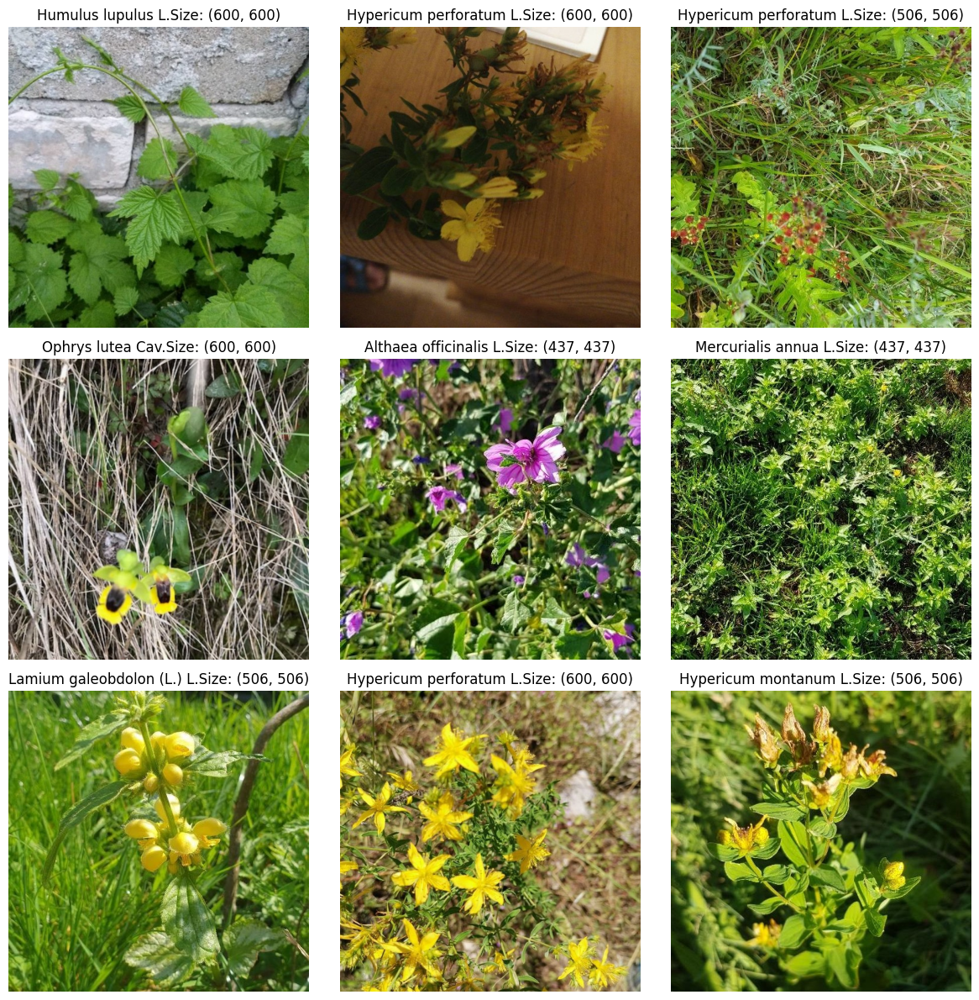

In [ ]:


# seed, buffer_size = 42, 10_000
shuffle_ds = split_dataset["train"].shuffle(10)

# import matplotlib.pyplot as plt

# Number of images per row and column
rows, cols = 3, 3
fig, axes = plt.subplots(rows, cols, figsize=(12, 12))

# Flatten the axes array
axes = axes.flatten()

# Iterate over images and display in the grid
for i, sample in enumerate(shuffle_ds):
    if i >= rows * cols:  # Limit to grid size
        break
    image = sample['image']
    label = sample['label']

    axes[i].imshow(image)
    axes[i].axis('off')  # Optional: Remove axes
    axes[i].set_title(get_species_name(label) + "Size: " + str(image.size))

# # Adjust spacing between subplots
# plt.tight_layout()

plt.tight_layout()
plt.show()


In [ ]:
split_dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 80000
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 20000
    })
})

In [ ]:
# load image processor
processor = AutoImageProcessor.from_pretrained('google/vit-base-patch16-224')
processor

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


ViTImageProcessor {
  "do_convert_rgb": null,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
# # Preprocessing function for images


def preprocess_images(batch):
    batch['image'] = [x for x in batch['image']]
    inputs = processor(batch['image'],return_tensors='pt')
    inputs['labels']=[label2id[y] for y in batch['label']]
    return inputs




In [ ]:
processed_dataset = split_dataset.with_transform(preprocess_images)
processed_dataset_eval = eval_dataset.with_transform(preprocess_images)

In [ ]:

# from torch.utils.data import DataLoader
# Data collator for batches
def collate_fn(batch):
    pixel_values = torch.stack([example["pixel_values"] for example in batch])
    labels = torch.tensor([example["labels"] for example in batch])
    return {"pixel_values": pixel_values, "labels": labels}

In [ ]:
import evaluate
import numpy as np
accuracy = evaluate.load('accuracy')
def compute_metrics(eval_preds):
    logits, labels = eval_preds
    predictions = np.argmax(logits,axis=1)
    score = accuracy.compute(predictions=predictions, references=labels)
    return score

In [ ]:
# load model
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    num_labels = len(labels),
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True
)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([204]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([204, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTSdpaAttention(
            (attention): ViTSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_fe

In [ ]:
for name,p in model.named_parameters():
    if not name.startswith('classifier'):
        p.requires_grad = False

In [ ]:
num_params = sum([p.numel() for p in model.parameters()])
trainable_params = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(f"{num_params = :,} | {trainable_params = :,}")

num_params = 85,955,532 | trainable_params = 156,876


In [ ]:
from transformers import Trainer, TrainingArguments

# using Trainer API to train model

training_args = TrainingArguments(
    output_dir="./vit-plantnet300k",
    per_device_train_batch_size=16,
    evaluation_strategy="steps",
    save_strategy="steps",
    logging_steps=100,
    num_train_epochs=4,
    learning_rate=3e-4,
    save_total_limit=2,
    remove_unused_columns=False,
    push_to_hub=False,
    report_to='none',
    load_best_model_at_end=True,
    max_steps=1000,
    gradient_accumulation_steps=2,
    fp16=True,
)


/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1575: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


In [ ]:

# Trainer setup
trainer = Trainer(
    model=model,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=processed_dataset["train"],
    eval_dataset=processed_dataset["test"],
    data_collator=collate_fn,
    tokenizer=processor,  # ViT does not use a tokenizer
)

<ipython-input-21-c749f3ce4da4>:2: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


In [ ]:
trainer.train()

Step,Training Loss,Validation Loss,Accuracy
100,6.297300,2.079874,0.613950
200,3.413000,1.473819,0.707550
300,2.671800,1.233083,0.747900
400,2.308000,1.096563,0.770050
500,2.211600,1.011499,0.783450
600,1.971900,0.960881,0.790950
700,1.878500,0.924717,0.798000
800,1.754900,0.901358,0.800200
900,1.810300,0.887371,0.803050
1000,1.777600,0.883098,0.804600


TrainOutput(global_step=1000, training_loss=2.609496673583984, metrics={'train_runtime': 3219.7987, 'train_samples_per_second': 9.939, 'train_steps_per_second': 0.311, 'total_flos': 2.484233149612032e+18, 'train_loss': 2.609496673583984, 'epoch': 0.4})

In [ ]:
trainer.evaluate(processed_dataset_eval)

{'eval_train_loss': 0.8861111402511597,
 'eval_train_accuracy': 0.8032,
 'eval_train_runtime': 131.3959,
 'eval_train_samples_per_second': 76.106,
 'eval_train_steps_per_second': 9.513,
 'epoch': 0.4,
 'eval_test_loss': 0.8800853490829468,
 'eval_test_accuracy': 0.806,
 'eval_test_runtime': 131.3921,
 'eval_test_samples_per_second': 76.108,
 'eval_test_steps_per_second': 9.514}

In [ ]:
processed_dataset_eval

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 10000
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 10000
    })
})

In [ ]:
from transformers import AutoFeatureExtractor

# Replace with the pretrained model name you used
model_name = "google/vit-base-patch16-224"

# Load the feature extractor
feature_extractor = AutoFeatureExtractor.from_pretrained(model_name)

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


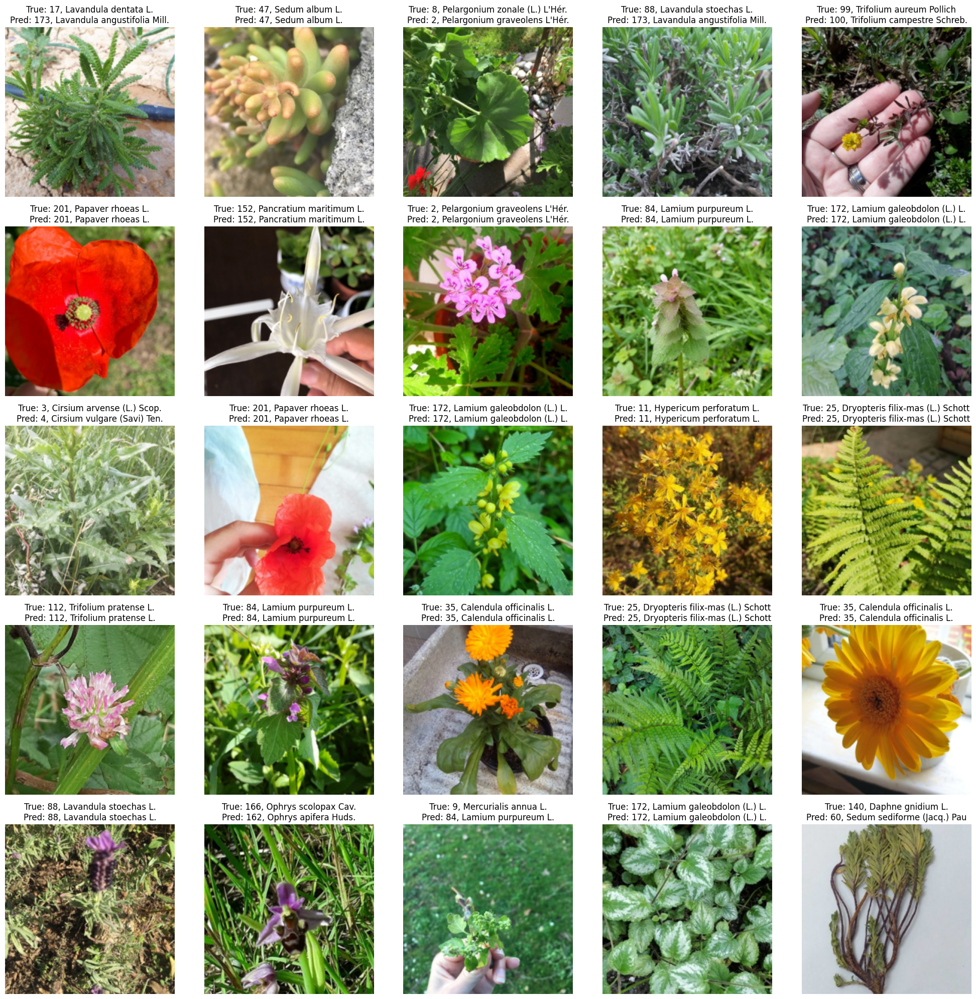

In [ ]:
import matplotlib.pyplot as plt
from torchvision.transforms import Normalize, ToPILImage

def test_model(dataset, model, feature_extractor, rows=5, cols=5):
    """
    Function to test the trained model on a sample dataset and display predictions.

    Args:
    - dataset (Dataset): The dataset to test the model on (e.g., validation or test set).
    - model (PreTrainedModel): The trained model to evaluate.
    - feature_extractor (FeatureExtractor): Preprocessor for images.
    - rows (int): Number of rows to display.
    - cols (int): Number of columns to display.
    """
    # Sample a few examples from the dataset
    sample_data = dataset["test"].shuffle(seed=42).select(range(rows * cols))
    fig = plt.figure(figsize=(cols * 4, rows * 4))

    # Reverse normalization parameters
    mean = feature_extractor.image_mean
    std = feature_extractor.image_std
    unnormalize = Normalize(
        mean=[-m / s for m, s in zip(mean, std)],
        std=[1 / s for s in std]
    )
    to_pil = ToPILImage()

    for i, example in enumerate(sample_data):
        # Access the image tensor
        if "pixel_values" in example:
            img_tensor = example["pixel_values"]  # The preprocessed image tensor
            img_tensor = unnormalize(img_tensor)  # Unnormalize the tensor
            img = to_pil(img_tensor)  # Convert tensor to PIL image
        else:
            raise KeyError("The dataset does not have 'pixel_values' for the image.")

        # Move tensors to the same device as the model
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        inputs = {"pixel_values": img_tensor.unsqueeze(0).to(device)}  # Add batch dimension
        model.to(device)

        # Perform prediction
        with torch.no_grad():
            outputs = model(**inputs)
            predicted_label = outputs.logits.argmax(dim=1).item()

        # Get the true label
        true_label = example["labels"]
        predicted_label_name = id2label[predicted_label]
        true_label_name = id2label[true_label]

        # Plot the image and predictions
        fig.add_subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(
            f"True: {true_label_name}, {get_species_name(true_label_name)}\n"
            f"Pred: {predicted_label_name}, {get_species_name(predicted_label_name)}"
        )
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Call the test_model function
test_model(
    dataset=processed_dataset_eval,  # Replace with your dataset
    model=model,  # The trained model
    feature_extractor=feature_extractor,  # Your feature extractor
    rows=5,
    cols=5
)


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
kwargs = {
    "finetuned_from": model.config._name_or_path,
    "dataset": 'mikehemberger/plantnet300K',
    "tasks": "image-classification",
    "tags": ['image-classification'],
}

In [ ]:
trainer.save_model()
trainer.push_to_hub('First commit', **kwargs)

training_args.bin:   0%|          | 0.00/5.30k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/344M [00:00<?, ?B/s]

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

CommitInfo(commit_url='https://huggingface.co/janjibDEV/vit-plantnet300k/commit/09e0c4d51fe3c8bb3a5ba7c0372d6e5cc6ee376b', commit_message='First commit', commit_description='', oid='09e0c4d51fe3c8bb3a5ba7c0372d6e5cc6ee376b', pr_url=None, repo_url=RepoUrl('https://huggingface.co/janjibDEV/vit-plantnet300k', endpoint='https://huggingface.co', repo_type='model', repo_id='janjibDEV/vit-plantnet300k'), pr_revision=None, pr_num=None)